In [1]:
import sys
import os
# Agrega la raíz del proyecto al path
project_root = os.path.abspath(os.path.join(os.getcwd(), ".."))
if project_root not in sys.path:
    sys.path.insert(0, project_root)

In [ ]:
# ──────────────────────────────────────────────────────────────────────────────────────────────────
# CELDA 1: Imports básicos, configuración de matplotlib y parámetros generales
# ──────────────────────────────────────────────────────────────────────────────────────────────────
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Para que las imágenes de matplotlib se muestren correctamente en Jupyter
%matplotlib inline
plt.rcParams["figure.figsize"] = (12, 8)


# ──────────────────────────────────────────────────────────────────────────────────────────────────
# CELDA 2: Importar funciones auxiliares desde nuestro script
# ──────────────────────────────────────────────────────────────────────────────────────────────────

# Asumimos que el archivo "auxiliares.py" está una carpeta por encima de notebooks/, 
# o en la misma carpeta de scripts. Ajusta la ruta si es necesario.
import sys
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), "..", "scripts")))

from scripts.prep_auxiliares_v1 import (
    recortar_tanque_con_desplazamiento_superior,
    eliminar_timestamp_manualmente,
    balance_blancos_simple,
    ajustar_brillo_contraste,
    separar_peces_con_watershed
)
# NOTA: segmentar_peces_color_gris_naranja lo implementaremos “inline” más abajo.


### Preprocesamiento paso a paso con n imagenes

In [3]:
# ──────────────────────────────────────────────────────────────────────────────────────────────────
# CELDA 3: Configurar rutas, leer CSV de etiquetas y muestrear imágenes por clase
# ──────────────────────────────────────────────────────────────────────────────────────────────────

# 1) Rutas y parámetros generales
labels_csv        = "../data/labels_etiquetado_v2.csv"
image_dir         = "../data/images"
output_root       = "../data/dataset_procesado"  # no se utiliza para guardar en este notebook, solo para referencia
df                = pd.read_csv(labels_csv)

classes           = ["saludable", "estres_leve", "enfermo"]
samples_per_class = 5   # Cantidad de imágenes aleatorias que mostraremos por cada clase

# 2) Tomar muestra aleatoria de imágenes por clase
muestras_por_clase = {}
for cls in classes:
    df_cls = df[df["etiqueta_rel"] == cls]
    if len(df_cls) >= samples_per_class:
        muestras_por_clase[cls] = df_cls.sample(samples_per_class, random_state=42)["imagen"].tolist()
    else:
        muestras_por_clase[cls] = df_cls["imagen"].tolist()
        print(f"Advertencia: Sólo {len(df_cls)} imágenes para clase '{cls}'.")


In [4]:
# ──────────────────────────────────────────────────────────────────────────────────────────────────
# CELDA 4: Definir rangos y parámetros para sombras, peces y filtrado
# ──────────────────────────────────────────────────────────────────────────────────────────────────

# A) Rangos HSV aproximados para identificar sombras (verde-oliva y blanco-verdoso)
h_min_oliva, h_max_oliva = 25, 85
s_max_oliva             = 80
s_max_blanco, v_min_blanco = 40, 180

# B) Rangos HSV para “peces naranja/rojizo”
lower1 = np.array([0, 60, 60])
upper1 = np.array([30, 255, 255])
lower2 = np.array([150, 60, 60])
upper2 = np.array([180, 255, 255])

# C) Parámetros LAB para “peces grises/plateados”
umbral_L = 140
delta_ab = 20

# D) Área mínima (px) para considerar un contorno como pez válido (evitar motas)
area_min = 20

# E) Parámetros de salida final (tamaño para red neuronal)
TAM_FINAL = (224, 224)

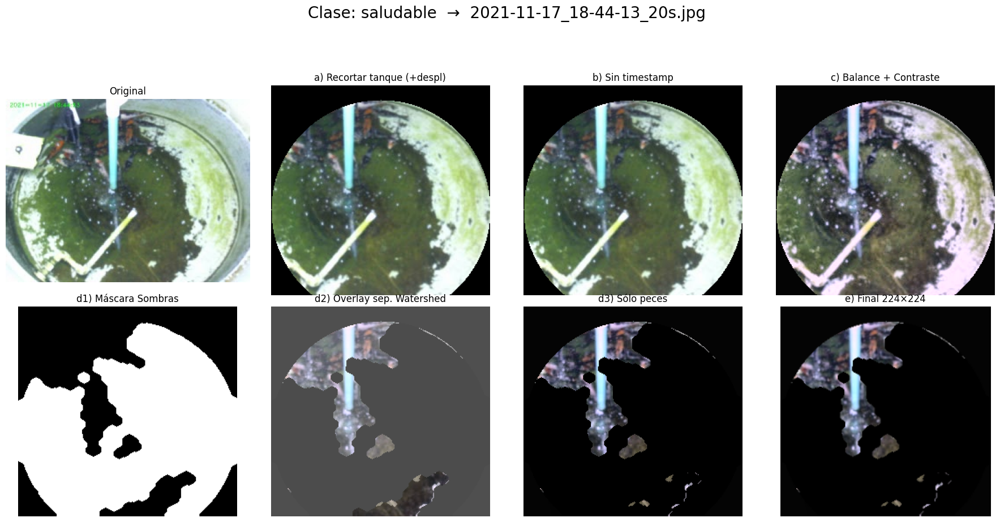

>>> Rangos HSV peces: H 0 - 179 | S 0 - 164 | V 0 - 255
>>> Rangos LAB peces: L 0 - 248 | a 108 - 151 | b 98 - 153

--------------------------------------------------------------------------------



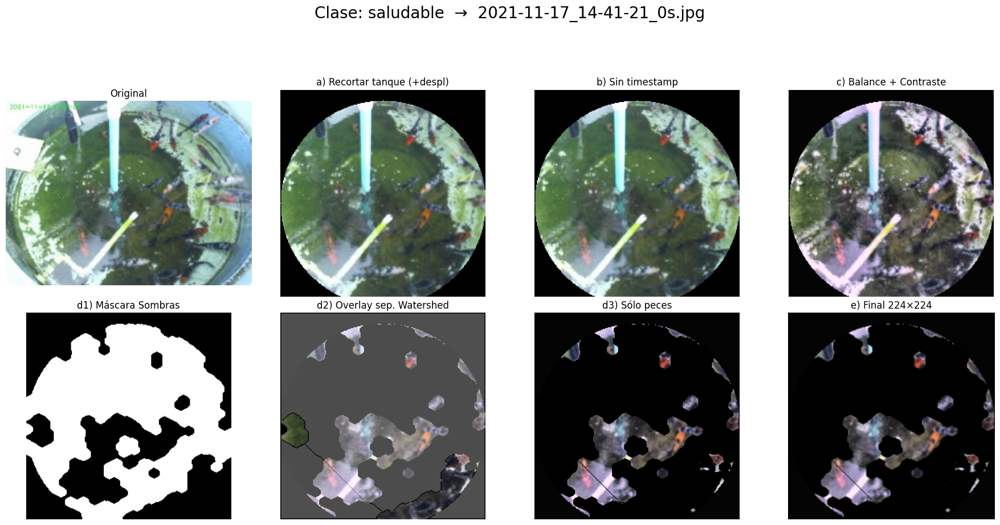

>>> Rangos HSV peces: H 0 - 179 | S 0 - 197 | V 0 - 255
>>> Rangos LAB peces: L 0 - 246 | a 115 - 181 | b 101 - 183

--------------------------------------------------------------------------------



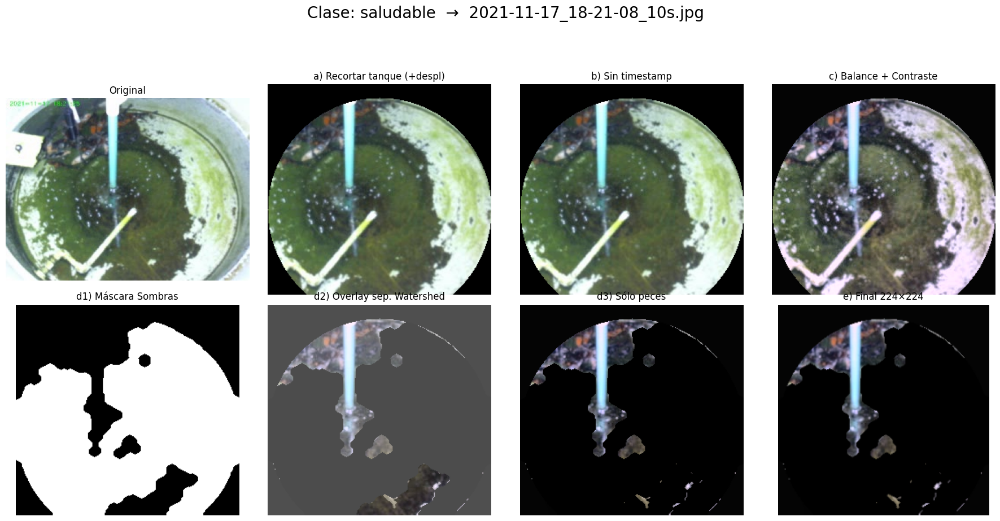

>>> Rangos HSV peces: H 0 - 179 | S 0 - 225 | V 0 - 255
>>> Rangos LAB peces: L 0 - 244 | a 107 - 158 | b 97 - 164

--------------------------------------------------------------------------------



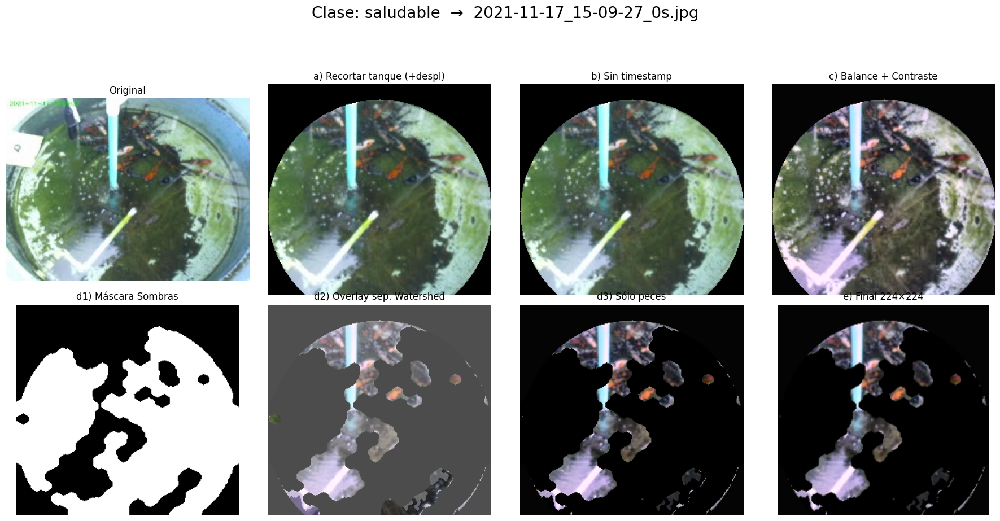

>>> Rangos HSV peces: H 0 - 179 | S 0 - 223 | V 0 - 255
>>> Rangos LAB peces: L 0 - 247 | a 107 - 171 | b 99 - 182

--------------------------------------------------------------------------------



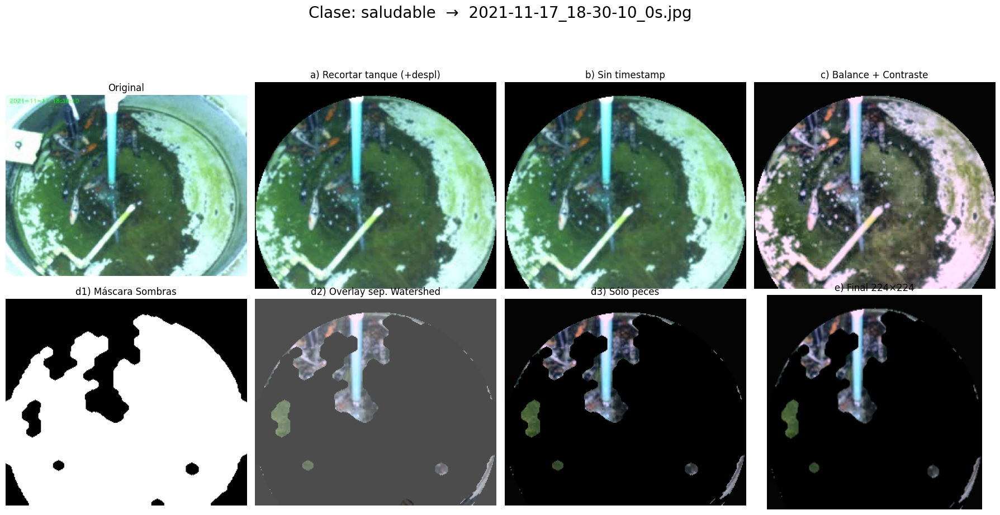

>>> Rangos HSV peces: H 0 - 179 | S 0 - 255 | V 0 - 255
>>> Rangos LAB peces: L 0 - 241 | a 102 - 162 | b 96 - 166

--------------------------------------------------------------------------------



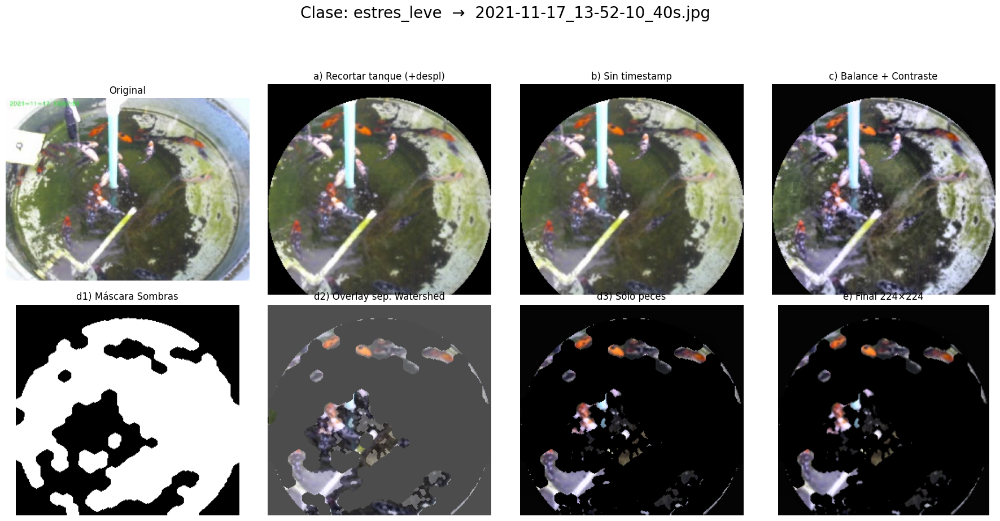

>>> Rangos HSV peces: H 0 - 179 | S 0 - 255 | V 0 - 255
>>> Rangos LAB peces: L 0 - 252 | a 113 - 181 | b 99 - 195

--------------------------------------------------------------------------------



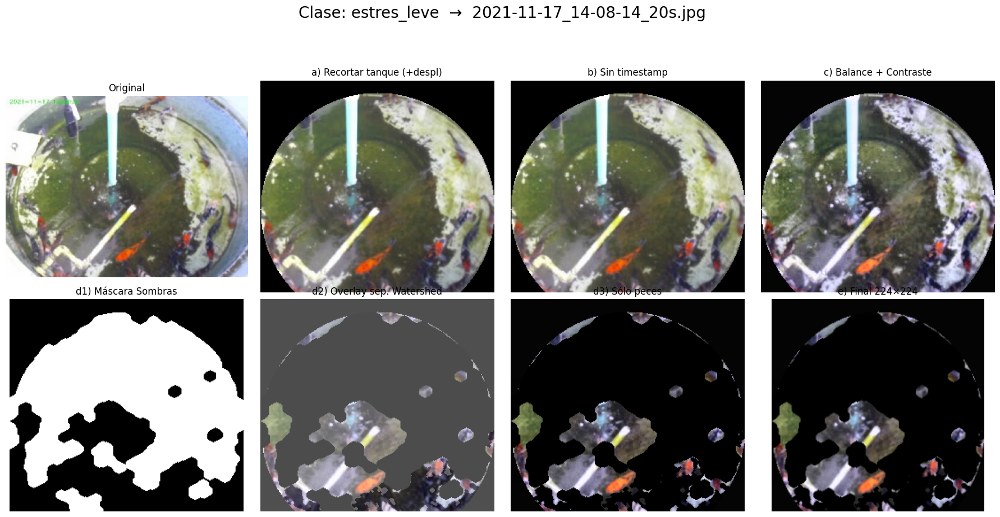

>>> Rangos HSV peces: H 0 - 179 | S 0 - 232 | V 0 - 255
>>> Rangos LAB peces: L 0 - 252 | a 109 - 186 | b 98 - 192

--------------------------------------------------------------------------------



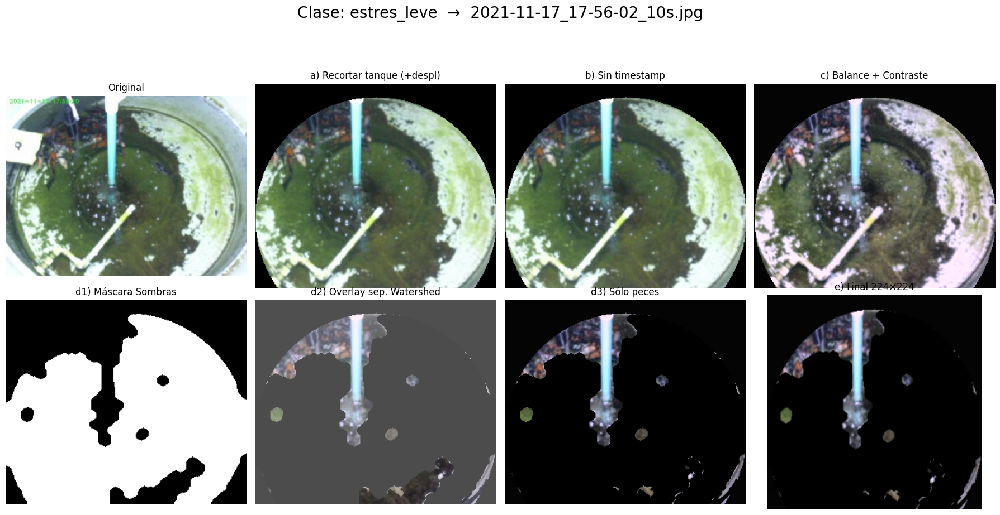

>>> Rangos HSV peces: H 0 - 179 | S 0 - 216 | V 0 - 255
>>> Rangos LAB peces: L 0 - 247 | a 105 - 158 | b 97 - 164

--------------------------------------------------------------------------------



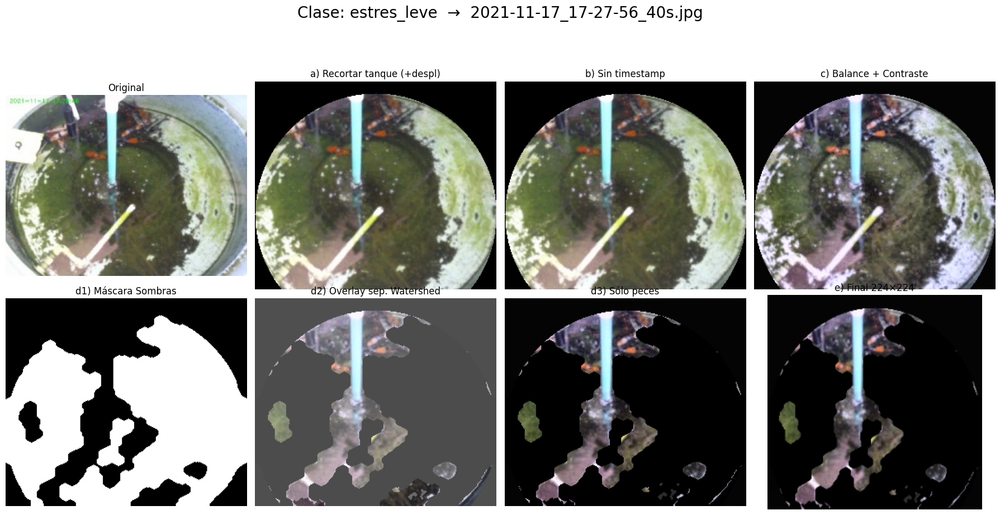

>>> Rangos HSV peces: H 0 - 179 | S 0 - 178 | V 0 - 255
>>> Rangos LAB peces: L 0 - 251 | a 104 - 171 | b 98 - 180

--------------------------------------------------------------------------------



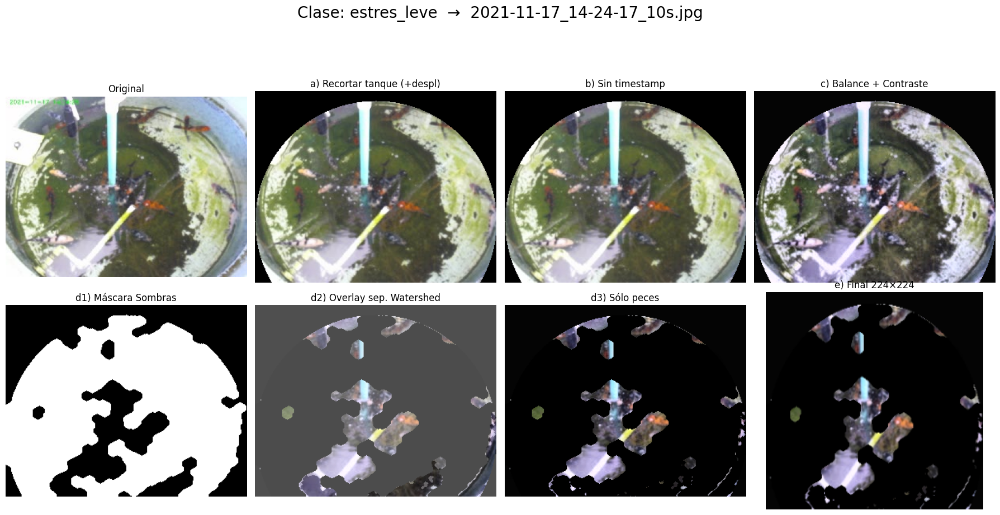

>>> Rangos HSV peces: H 0 - 179 | S 0 - 187 | V 0 - 255
>>> Rangos LAB peces: L 0 - 252 | a 106 - 164 | b 99 - 196

--------------------------------------------------------------------------------



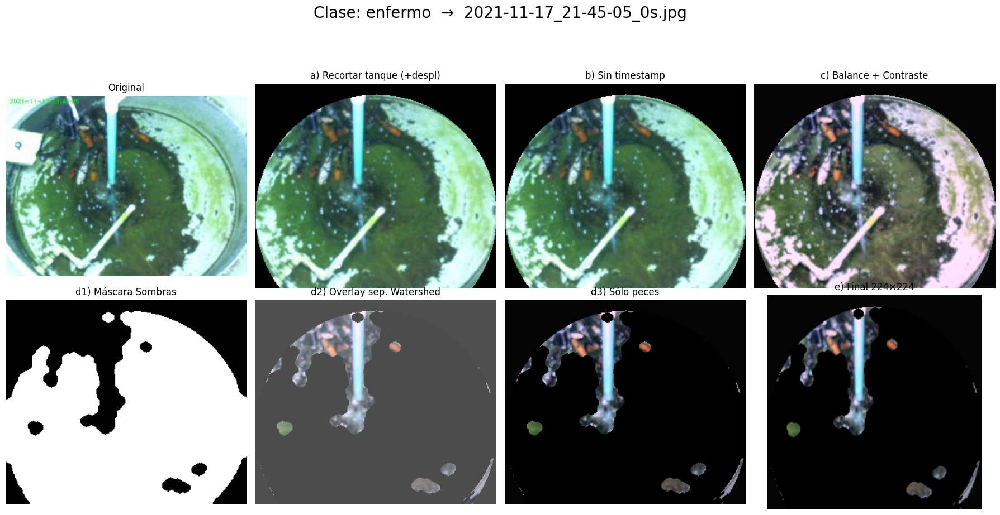

>>> Rangos HSV peces: H 0 - 179 | S 0 - 255 | V 0 - 255
>>> Rangos LAB peces: L 0 - 242 | a 104 - 171 | b 97 - 173

--------------------------------------------------------------------------------



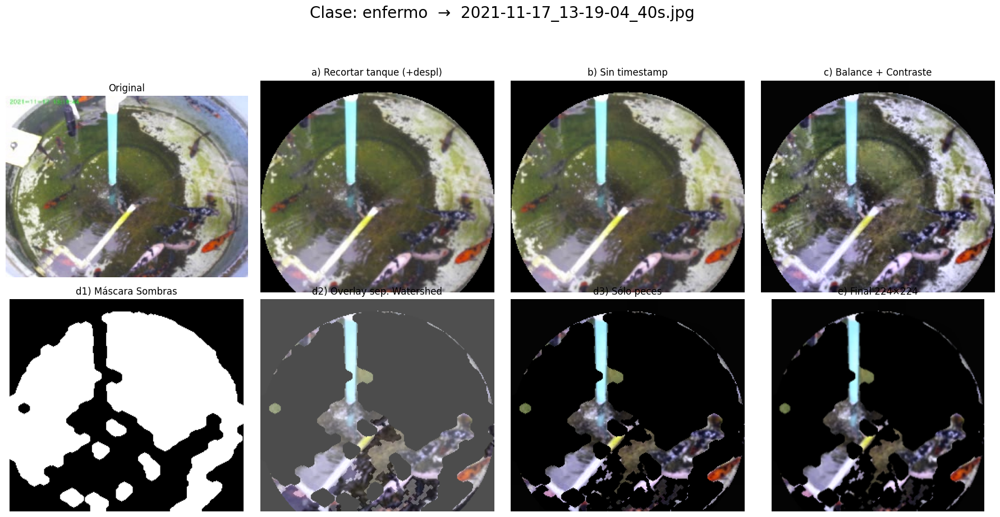

>>> Rangos HSV peces: H 0 - 179 | S 0 - 255 | V 0 - 255
>>> Rangos LAB peces: L 0 - 254 | a 103 - 186 | b 94 - 195

--------------------------------------------------------------------------------



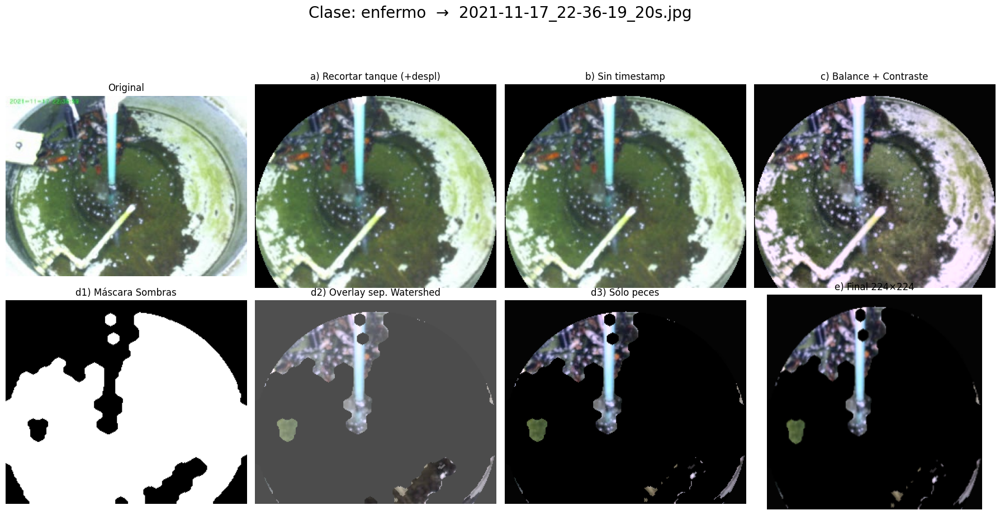

>>> Rangos HSV peces: H 0 - 179 | S 0 - 197 | V 0 - 255
>>> Rangos LAB peces: L 0 - 248 | a 107 - 155 | b 99 - 161

--------------------------------------------------------------------------------



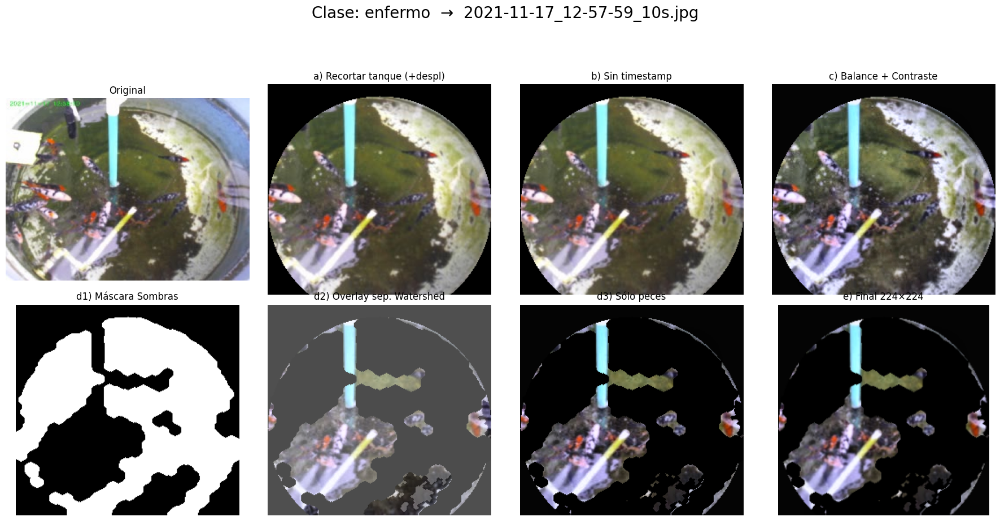

>>> Rangos HSV peces: H 0 - 179 | S 0 - 255 | V 0 - 255
>>> Rangos LAB peces: L 0 - 254 | a 99 - 186 | b 92 - 194

--------------------------------------------------------------------------------



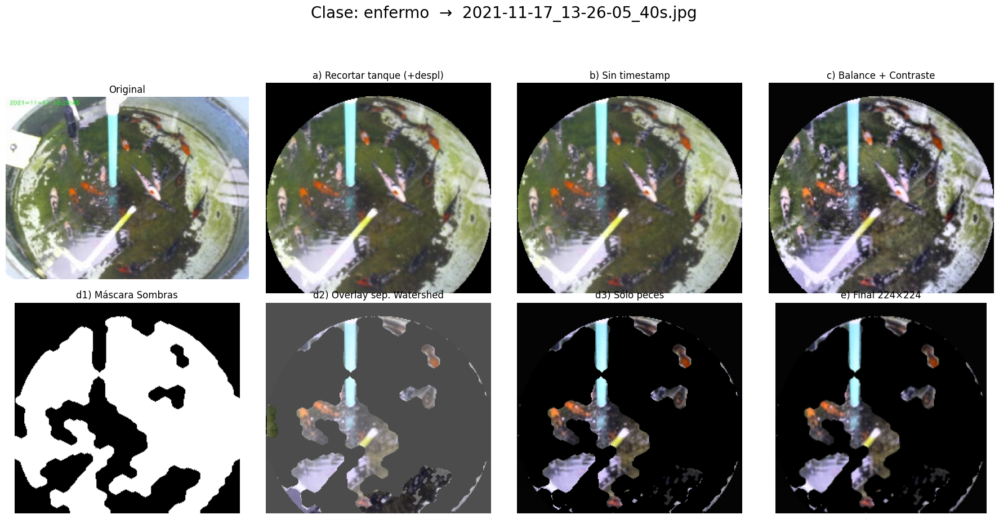

>>> Rangos HSV peces: H 0 - 179 | S 0 - 255 | V 0 - 255
>>> Rangos LAB peces: L 0 - 252 | a 104 - 174 | b 99 - 197

--------------------------------------------------------------------------------



In [5]:
# ──────────────────────────────────────────────────────────────────────────────────────────────────
# CELDA 5 (actualizada): Bloque principal de preprocesamiento VISUAL para cada clase e imagen
# ──────────────────────────────────────────────────────────────────────────────────────────────────

for cls in classes:
    imgs = muestras_por_clase[cls]
    for img_name in imgs:
        img_path = os.path.join(image_dir, img_name)
        img_original = cv2.imread(img_path)
        if img_original is None:
            continue

        # ─────────── a) Recortar tanque (+ desplazamiento superior) ───────────
        roi = recortar_tanque_con_desplazamiento_superior(img_original, desplazar_arriba=50)

        # ─────────── b) Eliminar timestamp superior izquierdo ───────────
        sin_ts = eliminar_timestamp_manualmente(roi, alto_ts=5, ancho_ts=250)

        # ─────────── c) Balance de blancos + Contraste (CLAHE) ───────────
        wb = balance_blancos_simple(sin_ts)
        eq = ajustar_brillo_contraste(wb)

        # ─────────── d) Detectar y eliminar sombras (verde-oliva y blanco-verdoso) ───────────
        hsv_eq = cv2.cvtColor(eq, cv2.COLOR_BGR2HSV)
        h_chan, s_chan, v_chan = cv2.split(hsv_eq)

        # (1) Sombra verde-oliva: H ∈ [25,85] y S < 80
        mask_h_oliva = cv2.inRange(h_chan, 25, 85)
        mask_s_oliva = cv2.inRange(s_chan, 0, 80)
        mask_oliva   = cv2.bitwise_and(mask_h_oliva, mask_s_oliva)

        # (2) Sombra blanco-verdosa: S < 40 y V > 180
        mask_s_blanco = cv2.inRange(s_chan, 0, 40)
        mask_v_blanco = cv2.inRange(v_chan, 180, 255)
        mask_blanco   = cv2.bitwise_and(mask_s_blanco, mask_v_blanco)

        # (3) Unión de ambas sombras
        mask_shadow = cv2.bitwise_or(mask_oliva, mask_blanco)

        # (4) Limpiar máscara de sombras con morph (kernel 7×7)
        kernel_s = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))
        mask_shadow = cv2.morphologyEx(mask_shadow, cv2.MORPH_CLOSE, kernel_s, iterations=2)
        mask_shadow = cv2.morphologyEx(mask_shadow, cv2.MORPH_OPEN,  kernel_s, iterations=2)

        # (5) Invertir → zonas “sin sombra”
        mask_no_shadow = cv2.bitwise_not(mask_shadow)

        # (6) Aplicar a imagen corregida para eliminar sombras
        eq_sin_sombra = cv2.bitwise_and(eq, eq, mask=mask_no_shadow)

        # ─────────── e) Segmentar peces (naranja, gris, blanco, negro, manchados) ───────────
        hsv2 = cv2.cvtColor(eq_sin_sombra, cv2.COLOR_BGR2HSV)
        lab2 = cv2.cvtColor(eq_sin_sombra, cv2.COLOR_BGR2LAB)

        #  e.1) Máscara naranja/rojizo
        m1 = cv2.inRange(hsv2, lower1, upper1)
        m2 = cv2.inRange(hsv2, lower2, upper2)
        mask_naranja = cv2.bitwise_or(m1, m2)

        #  e.2) Máscara gris/plateado (LAB)
        L2, a2, b2 = cv2.split(lab2)
        mask_L   = cv2.inRange(L2, umbral_L, 255)
        mask_a   = cv2.inRange(a2, 128 - delta_ab, 128 + delta_ab)
        mask_b   = cv2.inRange(b2, 128 - delta_ab, 128 + delta_ab)
        mask_gris = cv2.bitwise_and(mask_L, cv2.bitwise_and(mask_a, mask_b))

        #  e.3) Máscara “peces blancos” (LAB muy claro + baja saturación en HSV)
        mask_blanco_pez = cv2.inRange(L2, 200, 255)            # L muy alto
        mask_S_bajo     = cv2.inRange(hsv2[:, :, 1], 0, 50)     # saturación muy baja
        mask_blanco_pez = cv2.bitwise_and(mask_blanco_pez, mask_S_bajo)

        #  e.4) Máscara “peces negros” (HSV → V muy bajo)
        mask_negro_pez  = cv2.inRange(hsv2[:, :, 2], 0, 50)

        #  e.5) Combinar todas las máscaras de peces
        mask_comb1 = cv2.bitwise_or(mask_naranja, mask_gris)
        mask_comb2 = cv2.bitwise_or(mask_blanco_pez, mask_negro_pez)
        mask_comb  = cv2.bitwise_or(mask_comb1, mask_comb2)

        #  e.6) Limpiar con morph (kernel pequeño 3×3)
        kernel_p = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
        mask_close = cv2.morphologyEx(mask_comb, cv2.MORPH_CLOSE, kernel_p, iterations=1)
        mask_clean = cv2.morphologyEx(mask_close, cv2.MORPH_OPEN,  kernel_p, iterations=1)

        #  e.7) “Segmentado crudo” (solo para visualización)
        seg_crudo = cv2.bitwise_and(eq_sin_sombra, eq_sin_sombra, mask=mask_clean)

        # ─────────── f) Filtrar contornos por área mínima ───────────
        contours, _   = cv2.findContours(mask_clean, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        mask_filtered = np.zeros_like(mask_clean)
        for cnt in contours:
            if cv2.contourArea(cnt) >= (area_min * 0.6):
                # Aquí hacemos doble chequeo: incluso las regiones un poco
                # más pequeñas que area_min tienen una oportunidad.
                cv2.drawContours(mask_filtered, [cnt], -1, 255, -1)

        # Para asegurarnos de no descartar peces “muy delgados”:
        # si 'mask_filtered' resulta todo negro (o casi), usamos al menos 
        # todas las regiones de 'mask_clean' antes de filtrar:
        if cv2.countNonZero(mask_filtered) < 20:  
            # Menos de 20 px → asumimos que se han tirado peces muy finos 
            # y lo mejor es recuperar toda la mask_clean:
            mask_filtered = mask_clean.copy()

        # ─────────── g) Aplicar Watershed para separar peces agrupados ───────────
        markers_ws = separar_peces_con_watershed(mask_filtered)

        mask_sep = np.zeros_like(mask_filtered)
        for m in np.unique(markers_ws):
            # m == 0 o m == 1 → fondo o bordes; lo ignoramos
            if m <= 1:
                continue
            mask_sep[markers_ws == m] = 255

        # Si Watershed no generó más de una región válida, usamos la máscara previa
        if len(np.unique(markers_ws)) - 2 <= 1:
            mask_sep = mask_filtered.copy()

        # ─────────── h) “Solo peces” aplicando máscara final ───────────
        seg_separado = cv2.bitwise_and(eq_sin_sombra, eq_sin_sombra, mask=mask_sep)

        # ─────────── i) Overlay de la máscara final sobre la imagen sin sombra ───────────
        mask_col = cv2.cvtColor(mask_sep, cv2.COLOR_GRAY2BGR)
        overlay  = cv2.addWeighted(eq_sin_sombra, 0.7, mask_col, 0.3, 0)

        # ─────────── j) Redimensionar resultado final a 224×224 ───────────
        img_resized = cv2.resize(seg_separado, TAM_FINAL, interpolation=cv2.INTER_AREA)

        # ────────────────────────────────────────────────────────────────────────────────
        # CELDA 6: Visualización en 2×4 de todos los pasos (con espacio extra arriba)
        # ────────────────────────────────────────────────────────────────────────────────
        fig, axes = plt.subplots(2, 4, figsize=(18, 9))
        fig.suptitle(f"Clase: {cls}  →  {img_name}", fontsize=20, y=1.02)

        #  (1) ORIGINAL
        ax = axes[0, 0]
        ax.imshow(cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB))
        ax.set_title("Original")
        ax.axis("off")

        #  (2) Recorte tanque (+ desplazamiento superior)
        ax = axes[0, 1]
        ax.imshow(cv2.cvtColor(roi, cv2.COLOR_BGR2RGB))
        ax.set_title("a) Recortar tanque (+despl)")
        ax.axis("off")

        #  (3) Sin timestamp
        ax = axes[0, 2]
        ax.imshow(cv2.cvtColor(sin_ts, cv2.COLOR_BGR2RGB))
        ax.set_title("b) Sin timestamp")
        ax.axis("off")

        #  (4) Balance + Contraste
        ax = axes[0, 3]
        ax.imshow(cv2.cvtColor(eq, cv2.COLOR_BGR2RGB))
        ax.set_title("c) Balance + Contraste")
        ax.axis("off")

        #  (5) Máscara de sombras detectadas
        ax = axes[1, 0]
        ax.imshow(mask_shadow, cmap="gray")
        ax.set_title("d1) Máscara Sombras")
        ax.axis("off")

        #  (6) Overlay sep. Watershed sobre eq sin sombra
        ax = axes[1, 1]
        ax.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
        ax.set_title("d2) Overlay sep. Watershed")
        ax.axis("off")

        #  (7) Sólo peces separados (o mask_filtered si Watershed falló)
        ax = axes[1, 2]
        ax.imshow(cv2.cvtColor(seg_separado, cv2.COLOR_BGR2RGB))
        ax.set_title("d3) Sólo peces")
        ax.axis("off")

        #  (8) Final 224×224
        ax = axes[1, 3]
        ax.imshow(cv2.cvtColor(img_resized, cv2.COLOR_BGR2RGB))
        ax.set_title("e) Final 224×224")
        ax.axis("off")

        # Ajustamos el layout para que no se superpongan los títulos
        plt.tight_layout(rect=[0, 0.00, 1, 0.94])
        plt.show()

        # ────────────────────────────────────────────────────────────────────────────────
        # CELDA 7: Imprimir rangos HSV y LAB de los píxeles detectados (mask_sep)
        # ────────────────────────────────────────────────────────────────────────────────
        hsv_peces = hsv2[mask_sep > 0]
        lab_peces = lab2[mask_sep > 0]

        if len(hsv_peces) > 0:
            print(">>> Rangos HSV peces:",
                  "H", hsv_peces[:, 0].min(), "-", hsv_peces[:, 0].max(),
                  "| S", hsv_peces[:, 1].min(), "-", hsv_peces[:, 1].max(),
                  "| V", hsv_peces[:, 2].min(), "-", hsv_peces[:, 2].max())
        else:
            print(">>> No se detectaron peces (HSV). Revisa rangos HSV.")

        if len(lab_peces) > 0:
            print(">>> Rangos LAB peces:",
                  "L", lab_peces[:, 0].min(), "-", lab_peces[:, 0].max(),
                  "| a", lab_peces[:, 1].min(), "-", lab_peces[:, 1].max(),
                  "| b", lab_peces[:, 2].min(), "-", lab_peces[:, 2].max())
        else:
            print(">>> No se detectaron peces (LAB). Revisa rangos LAB.")

        print("\n" + "-" * 80 + "\n")